In [ ]:
!pip install ultralytics gradio opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 58.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 9.2 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


In [ ]:
import cv2
import numpy as np
import gradio as gr
from ultralytics import YOLO
from scipy.spatial import distance
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from base64 import b64decode
import threading
import time
import PIL.Image
import io

**bold text**Upload a webcam video

In [ ]:


# Load the YOLOv8 model
model = YOLO("yolov8n.pt")

# Constants for speed estimation
trackers = {}
PIXELS_TO_METERS = 0.05  # Adjust based on your setup
FRAME_RATE = 30  # Estimated frame rate

# Function to process each frame
def process_frame(frame):
    global trackers
    if frame is None:
        return None

    # Convert frame to RGB format for YOLO processing
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = model(frame_rgb)[0]
    detections = []

    # Extract person detections (class_id = 0)
    for detection in results.boxes.data:
        x1, y1, x2, y2, score, class_id = map(int, detection[:6])
        if class_id == 0:  # Class 0 corresponds to 'person'
            cx = (x1 + x2) // 2
            cy = (y1 + y2) // 2
            detections.append((cx, cy, x1, y1, x2, y2))

    # Update tracker and estimate speed
    new_trackers = {}
    for det in detections:
        cx, cy, x1, y1, x2, y2 = det
        min_dist = float("inf")
        closest_id = None

        # Find the closest tracked object
        for track_id, (prev_cx, prev_cy, prev_speed) in trackers.items():
            dist = distance.euclidean((cx, cy), (prev_cx, prev_cy))
            if dist < min_dist and dist < 50:  # Threshold for tracking
                min_dist = dist
                closest_id = track_id

        # Update or create new tracker entry
        if closest_id is not None:
            speed = (min_dist * PIXELS_TO_METERS) * FRAME_RATE
            new_trackers[closest_id] = (cx, cy, speed)
            # Draw bounding box and speed on frame
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"ID {closest_id}: {speed:.2f} m/s", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        else:
            new_id = len(trackers) + 1
            new_trackers[new_id] = (cx, cy, 0)

    trackers.clear()
    trackers.update(new_trackers)

    return frame

# Gradio function for processing video frames
def detect_speed(video):
    cap = cv2.VideoCapture(video)
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        processed_frame = process_frame(frame)
        if processed_frame is not None:
            yield processed_frame
    cap.release()

# Gradio Interface
app = gr.Interface(
    fn=detect_speed,
    inputs=gr.Video(streaming=True),
    outputs="image",
    live=True,
    title="Real-Time Human Detection and Speed Estimation",
    description="YOLOv8-based app for detecting humans and estimating their speed using webcam feed."
)

# Launch the Gradio app
app.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://6a60c5a782e2b3e09c.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


**bold text**Real time using webcam


<IPython.core.display.Javascript object>


0: 480x640 (no detections), 176.5ms
Speed: 4.6ms preprocess, 176.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)


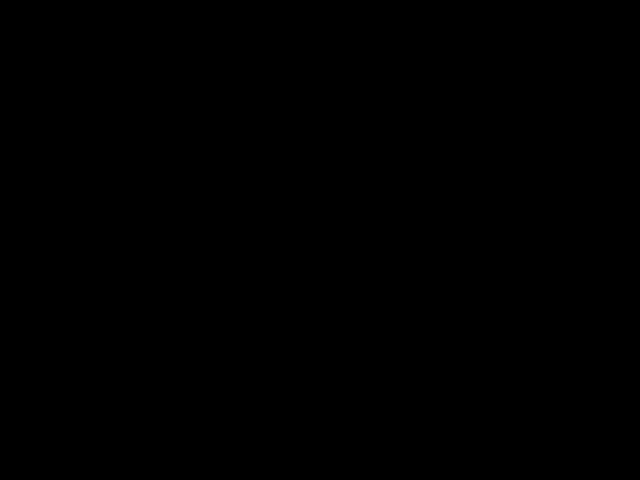


0: 480x640 1 person, 205.6ms
Speed: 4.7ms preprocess, 205.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


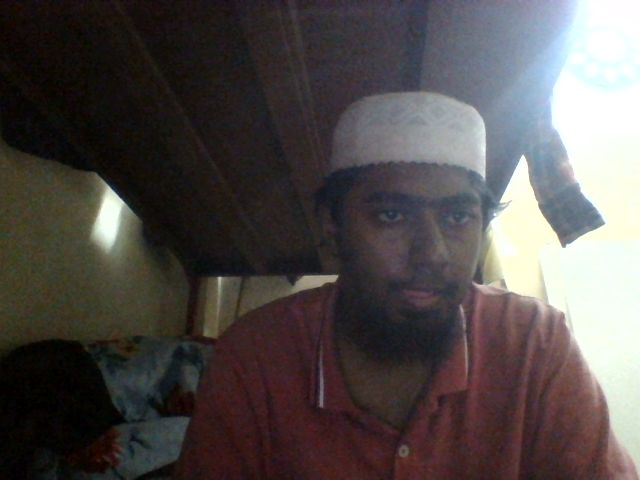


0: 480x640 1 person, 201.8ms
Speed: 2.7ms preprocess, 201.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


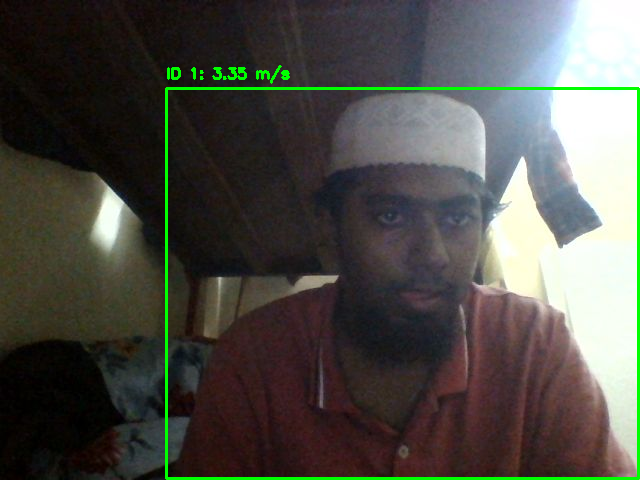


0: 480x640 1 person, 223.0ms
Speed: 2.7ms preprocess, 223.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


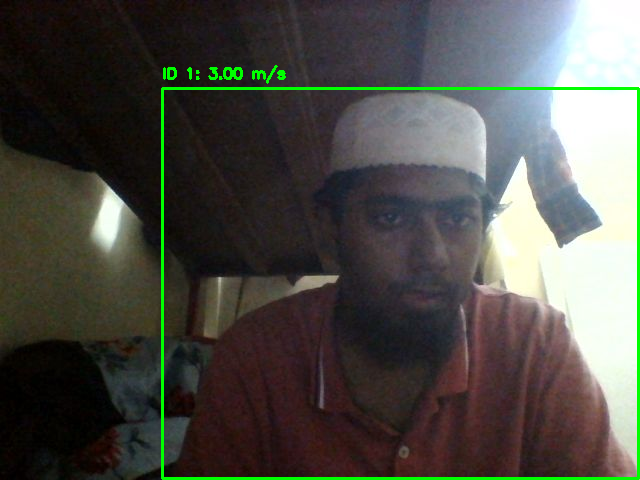


0: 480x640 1 person, 211.7ms
Speed: 2.6ms preprocess, 211.7ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)


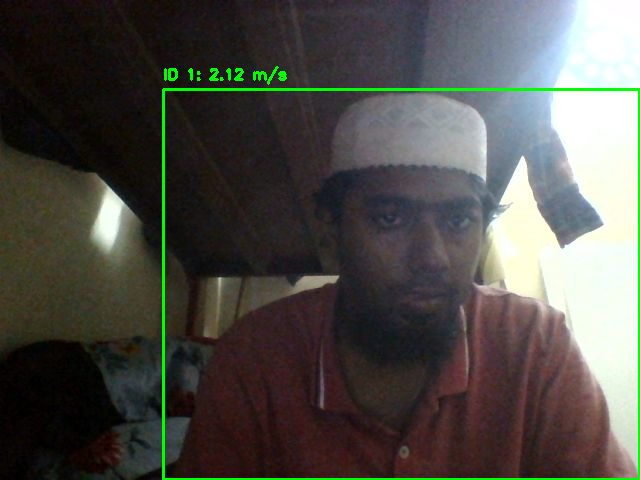


0: 480x640 1 person, 313.6ms
Speed: 2.4ms preprocess, 313.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


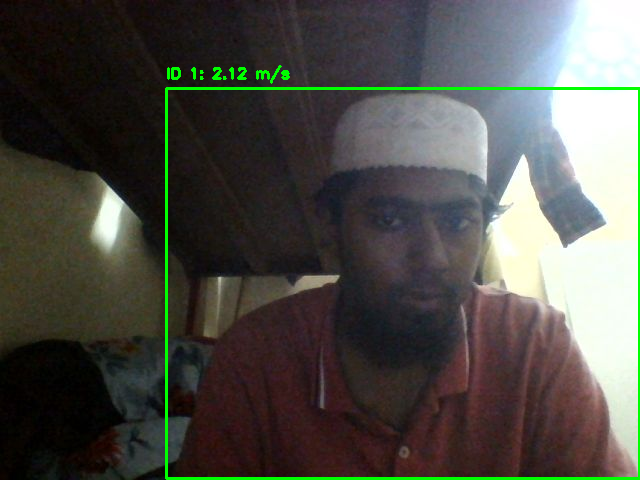


0: 480x640 1 person, 306.6ms
Speed: 2.4ms preprocess, 306.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


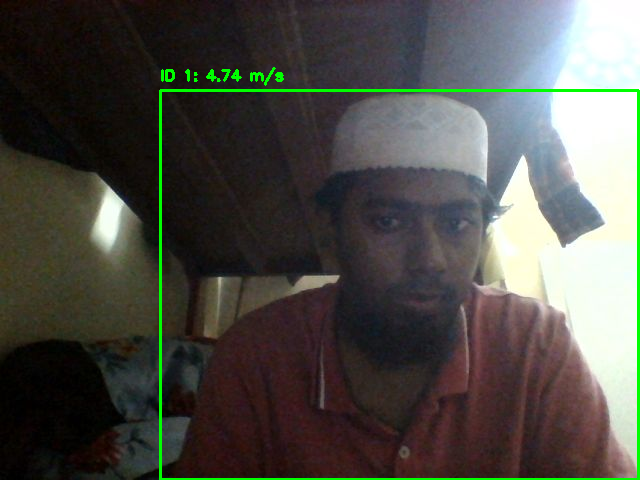


0: 480x640 1 person, 326.1ms
Speed: 2.8ms preprocess, 326.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


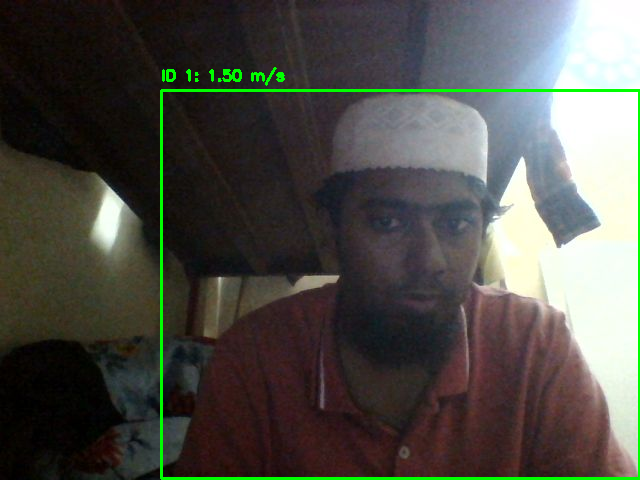


0: 480x640 1 person, 317.0ms
Speed: 6.4ms preprocess, 317.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


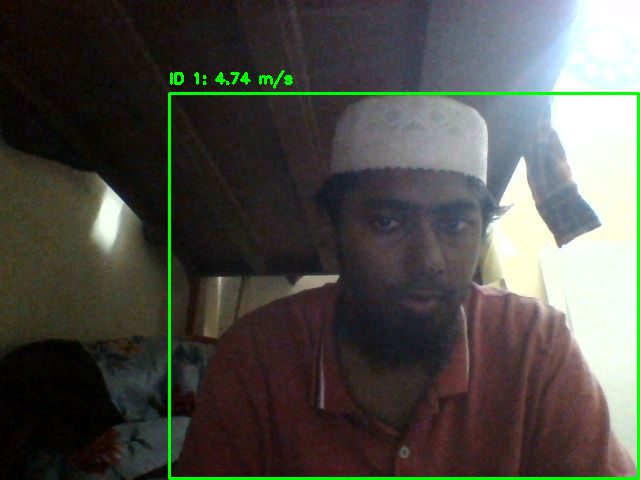


0: 480x640 1 person, 333.1ms
Speed: 2.3ms preprocess, 333.1ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


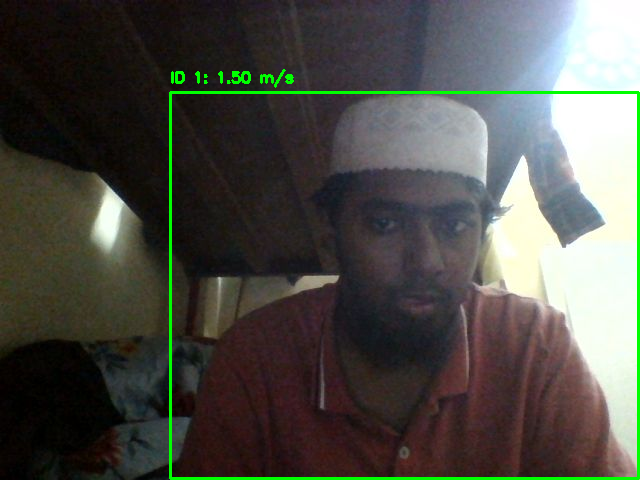


0: 480x640 1 person, 266.4ms
Speed: 2.4ms preprocess, 266.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


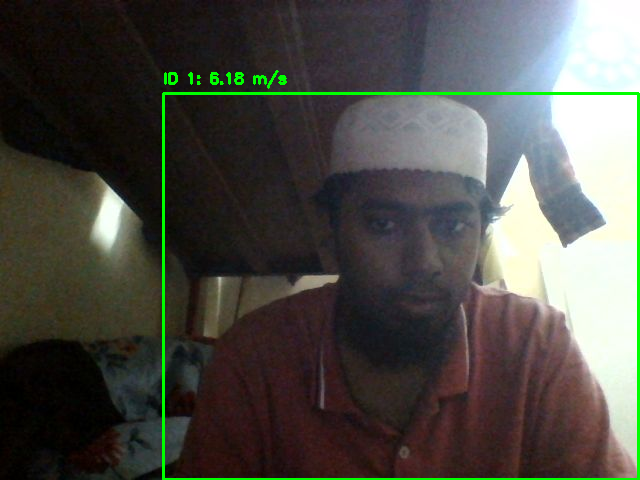


0: 480x640 1 person, 208.7ms
Speed: 2.7ms preprocess, 208.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


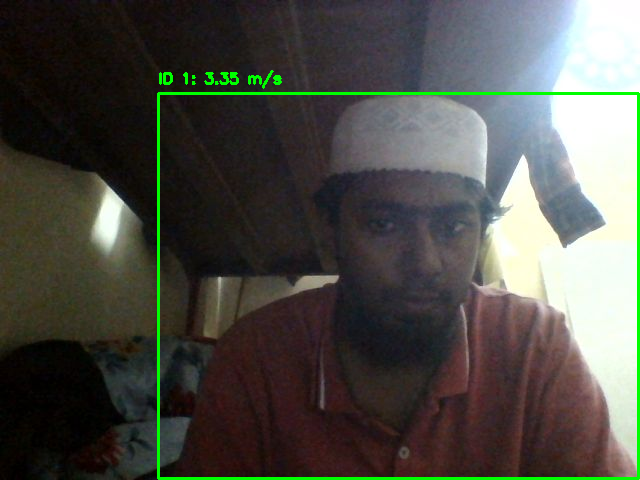


0: 480x640 2 persons, 238.5ms
Speed: 3.6ms preprocess, 238.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


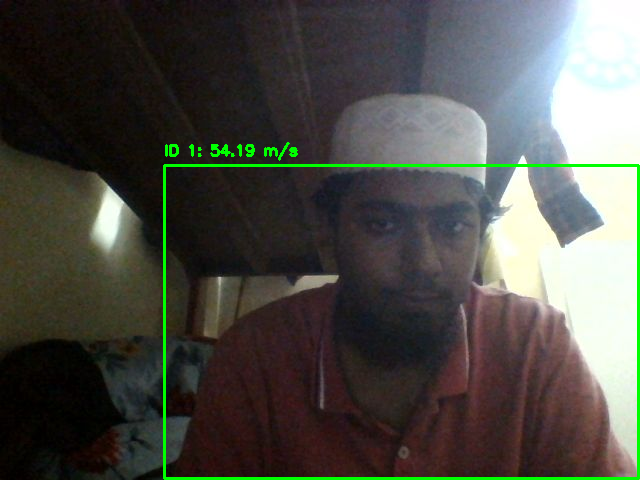


0: 480x640 1 person, 263.8ms
Speed: 3.1ms preprocess, 263.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


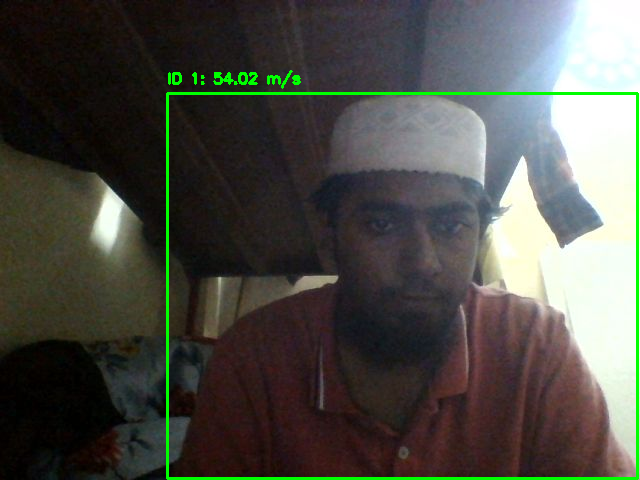


0: 480x640 1 person, 200.6ms
Speed: 2.4ms preprocess, 200.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


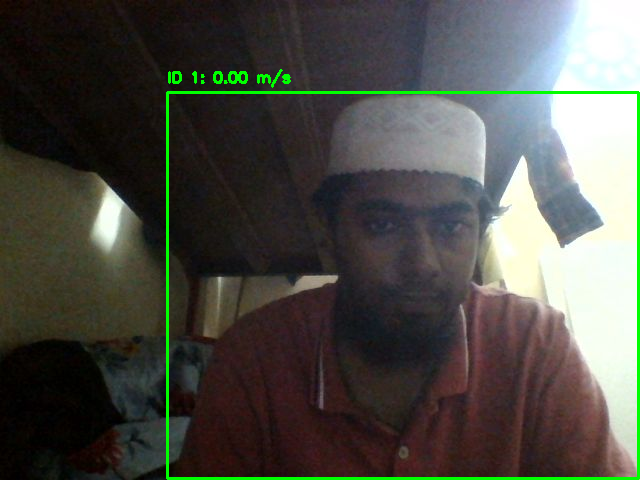


0: 480x640 1 person, 253.4ms
Speed: 3.3ms preprocess, 253.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


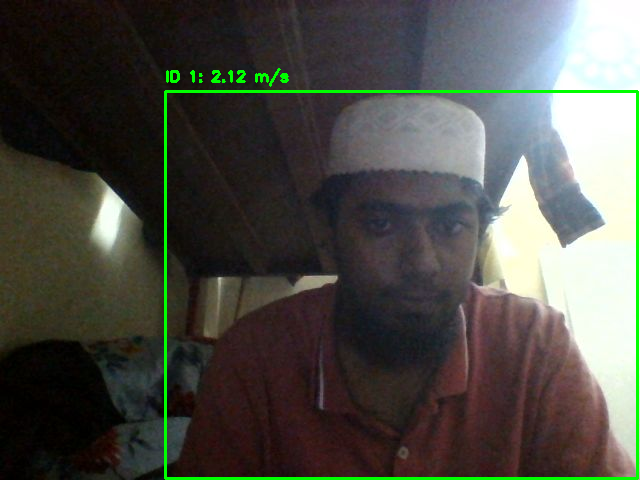


0: 480x640 1 person, 197.2ms
Speed: 2.3ms preprocess, 197.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


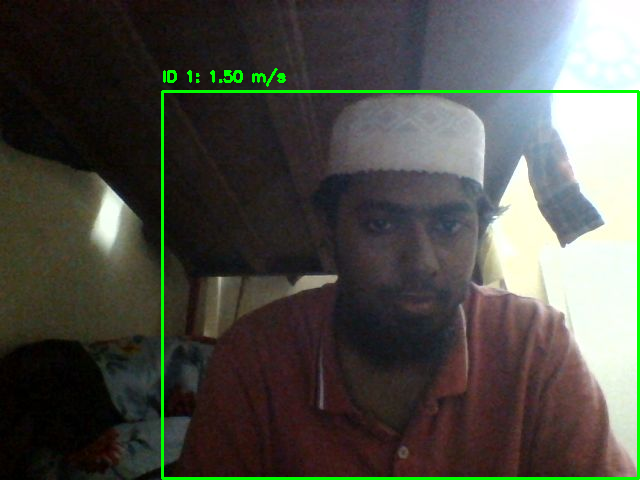


0: 480x640 1 person, 1 dog, 207.2ms
Speed: 2.5ms preprocess, 207.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


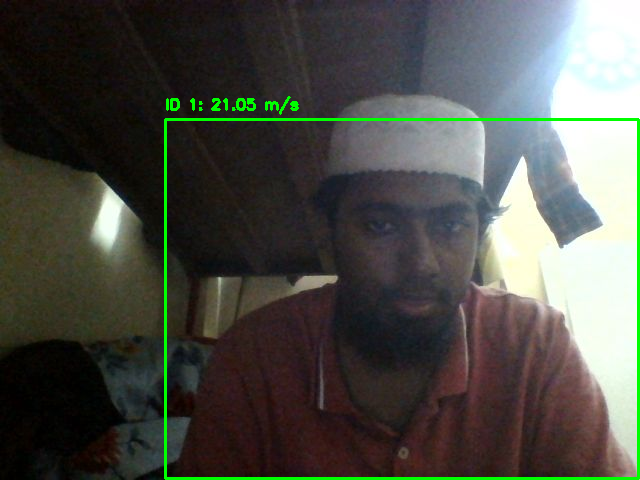


0: 480x640 1 person, 218.2ms
Speed: 2.4ms preprocess, 218.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


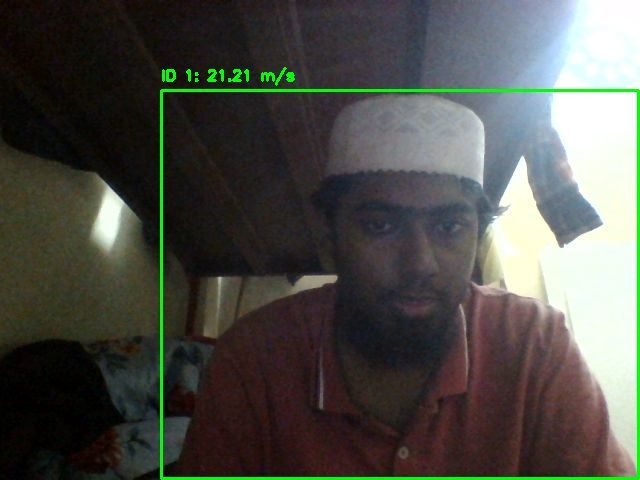


0: 480x640 1 person, 219.9ms
Speed: 2.5ms preprocess, 219.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


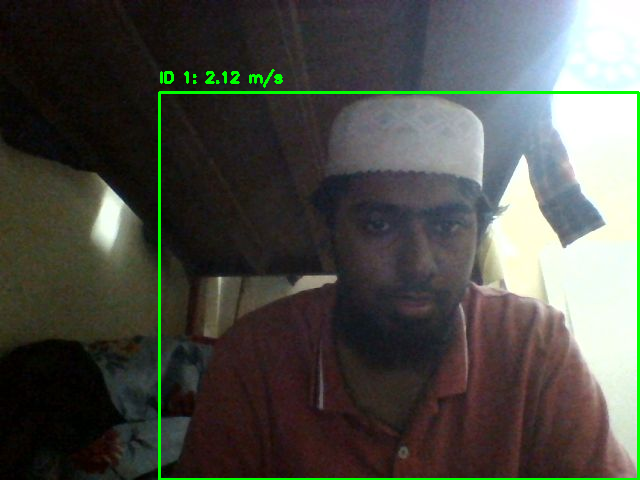


0: 480x640 1 person, 280.7ms
Speed: 4.9ms preprocess, 280.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


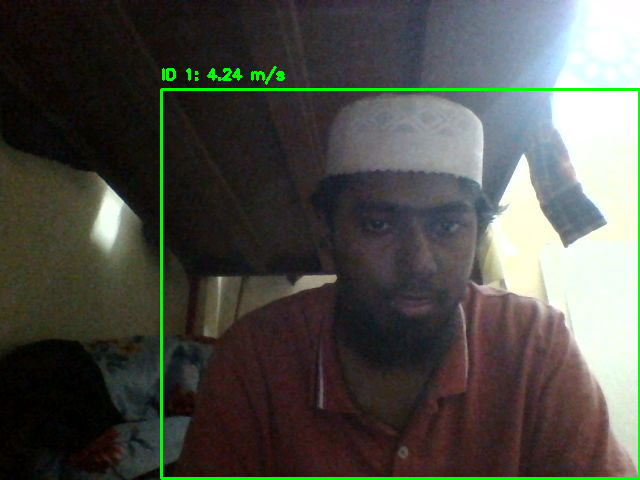


0: 480x640 1 person, 264.3ms
Speed: 2.6ms preprocess, 264.3ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


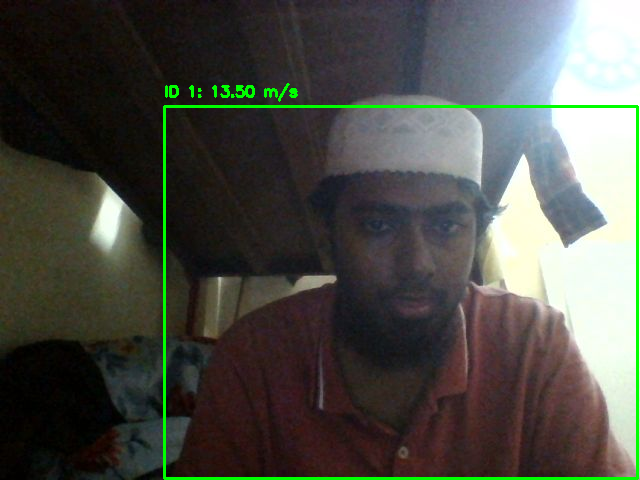


0: 480x640 1 person, 217.4ms
Speed: 5.8ms preprocess, 217.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


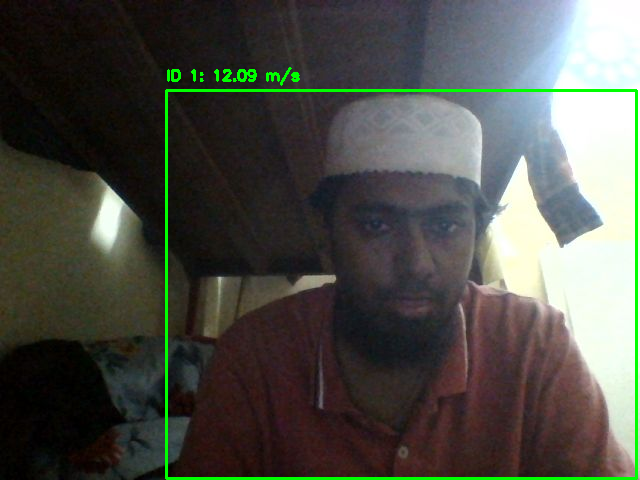


0: 480x640 1 person, 400.4ms
Speed: 11.4ms preprocess, 400.4ms inference, 3.4ms postprocess per image at shape (1, 3, 480, 640)


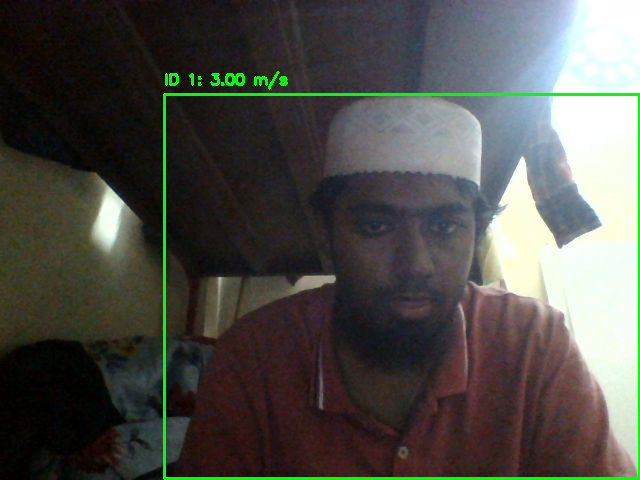


0: 480x640 1 person, 372.2ms
Speed: 2.5ms preprocess, 372.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


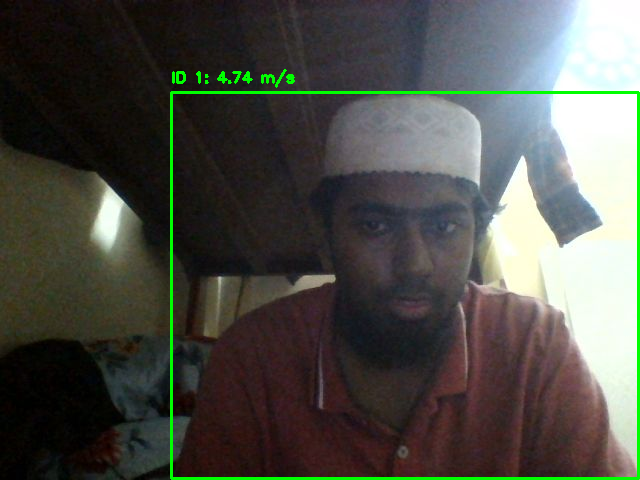


0: 480x640 1 person, 194.1ms
Speed: 2.5ms preprocess, 194.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


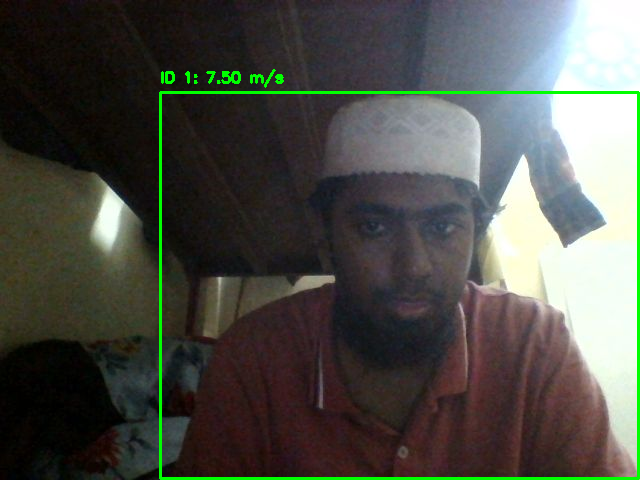


0: 480x640 2 persons, 229.1ms
Speed: 2.8ms preprocess, 229.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


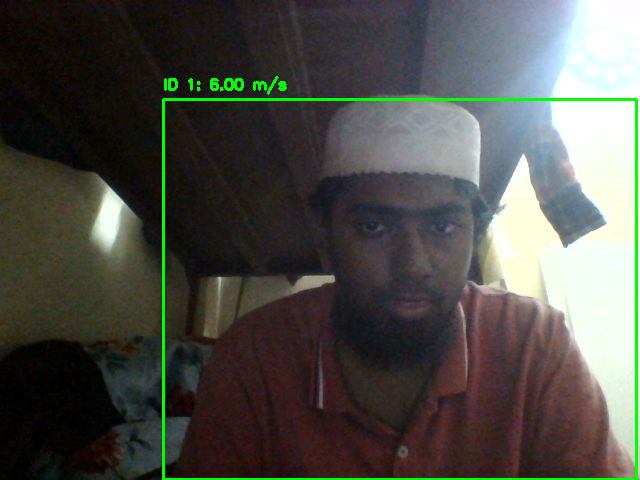


0: 480x640 1 person, 206.9ms
Speed: 2.4ms preprocess, 206.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


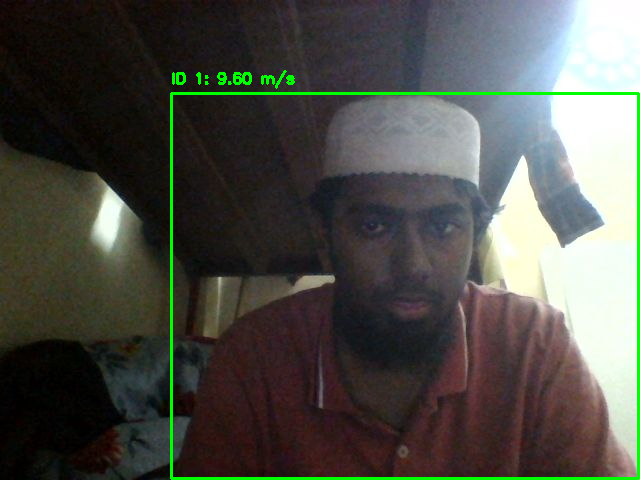


0: 480x640 1 person, 212.0ms
Speed: 2.3ms preprocess, 212.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


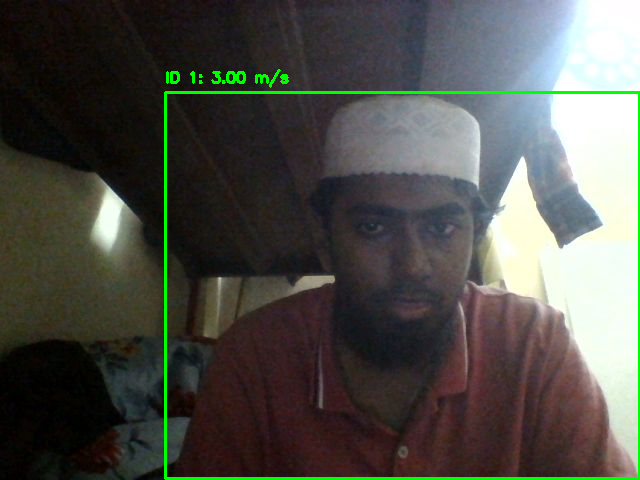


0: 480x640 1 person, 237.1ms
Speed: 2.6ms preprocess, 237.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


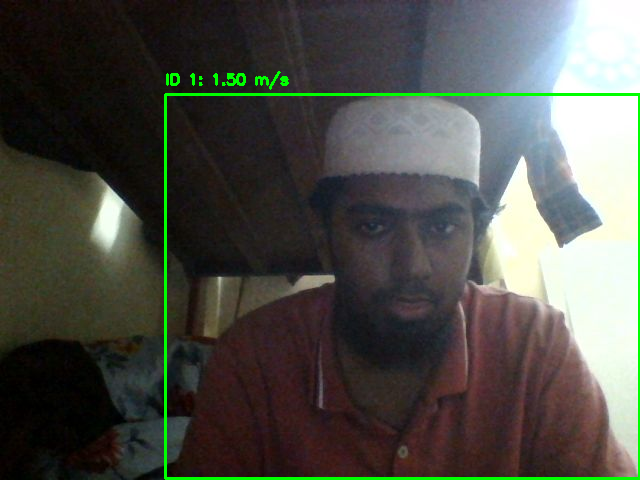


0: 480x640 2 persons, 221.5ms
Speed: 2.4ms preprocess, 221.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


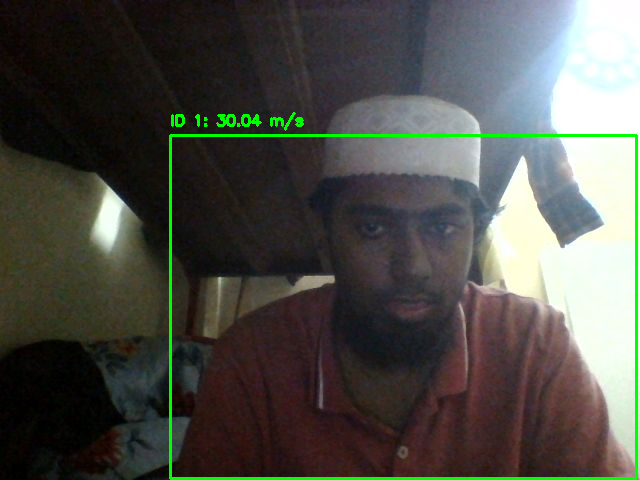

Stream stopped


In [9]:
def capture_video():
    display(Javascript('''
        async function captureVideo() {
            const video = document.createElement('video');
            video.width = 640;
            video.height = 480;
            video.autoplay = true;
            document.body.appendChild(video);
            const stream = await navigator.mediaDevices.getUserMedia({ video: true });
            video.srcObject = stream;

            let canvas = document.createElement('canvas');
            canvas.width = 640;
            canvas.height = 480;
            const ctx = canvas.getContext('2d');

            // Button to stop the video stream and tracking
            const stopButton = document.createElement('button');
            stopButton.innerText = 'Stop Video Stream';
            document.body.appendChild(stopButton);
            stopButton.onclick = () => {
                google.colab.kernel.invokeFunction('notebook.stopStream', [], {});
                stream.getTracks().forEach(track => track.stop());
                video.pause();
            };

            // Capture frames and send to Python
            for (;;) {
                if (!stream.active) return; // Stop loop if stream is stopped
                ctx.drawImage(video, 0, 0, 640, 480);
                let imgData = canvas.toDataURL('image/jpeg', 0.8);
                google.colab.kernel.invokeFunction('notebook.captureFrame', [imgData], {});
                await new Promise(resolve => setTimeout(resolve, 100));
            }
        }
        captureVideo();
    '''))

# Frame capture callback
def capture_frame(data):
    img_bytes = b64decode(data.split(',')[1])
    img = PIL.Image.open(io.BytesIO(img_bytes))
    frame = np.array(img)
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
    process_frame(frame)

# Register callback function for frame capture
output.register_callback('notebook.captureFrame', capture_frame)

# Stop stream callback
def stop_stream():
    global is_streaming
    is_streaming = False
    print("Stream stopped")

# Register stop stream function
output.register_callback('notebook.stopStream', stop_stream)

# Start video capture
capture_video()